In [2]:
import numpy as np
import pandas as pd
rng = np.random.default_rng(12345)

from lymph.models import Unilateral
from lymixture import LymphMixture
from lymixture.utils import binom_pmf, late_binomial, normalize
from fixtures import get_patient_data
PARAMS_C1 = {
    "TtoII_spread": 0.05,
    "TtoIII_spread": 0.25,
    "IItoIII_spread": 0.5,
    "late_p": 0.5,
}
PARAMS_C2 = {
    "TtoII_spread": 0.25,
    "TtoIII_spread": 0.05,
    "IItoIII_spread": 0.1,
    "late_p": 0.5,
}

In [3]:
# data = pd.read_csv("data/mixture.csv", header=[0,1,2])
# new_column = pd.MultiIndex.from_tuples([('diagnose', 'ipsi', ['II', 'III'])])

# Initialize the new column with None values
# data['diagnose', 'ipsi', 'II'] = None
# data['diagnose', 'ipsi', 'III'] = None

# data


In [3]:
graph = {
    ("tumor", "T"): ["II", "III", "IV"],
    ("lnl", "II"): ["III"],
    ("lnl", "III"): ["IV"],
    ("lnl", "IV"): [],
}
num_components = 2

mixture = LymphMixture(
    model_cls=Unilateral,
    model_kwargs={"graph_dict": graph},
    num_components=num_components,
    universal_p= False
)

mixture.set_distribution("early", binom_pmf(np.arange(11), 10, 0.3))
mixture.set_distribution("late", late_binomial)
mixture.get_all_distributions()

PARAMS_C1 = {
    "0_TtoII_spread": 0.05,
    "0_TtoIII_spread": 0.25,
    "0_TtoIV_spread": 0.5,
    "0_IItoIII_spread": 0.5,
    "0_IIItoIV_spread": 0.5,
    "0_late_p": 0.5,
}
PARAMS_C2 = {
    "1_TtoII_spread": 0.25,
    "1_TtoIII_spread": 0.05,
    "1_TtoIV_spread": 0.1,
    "1_IItoIII_spread": 0.1,
    "1_IIItoIV_spread": 0.1,
    "1_late_p": 0.5,
}
mixture.set_params(**PARAMS_C1)
mixture.set_params(**PARAMS_C2)


# mixture.load_patient_data(
#     data,
#     split_by=("tumor", "1", "subsite"),
#     mapping=lambda x: x,
# )

# mixture.set_modality("path", 1., 1.)
# mixture.set_modality("diagnose", 1., 0.81 )
mixture.components[0].set_modality("path", 1., 1.)
mixture.components[1].set_modality("path", 1., 1.)


In [4]:
num_s1 = 350
num_s2 = 200
num_s3 = 450
tstage_ratio = 0.5
mix1 = 0.2
mix2 = 0.5
mix3 = 0.9
mixture.set_params(**PARAMS_C1)
c1_data = mixture.components[0].draw_patients(
    num=int(np.round(num_s1*mix1)) + int(np.round(num_s2 * mix2)) + int(np.round(num_s3 * mix3)),
    stage_dist=[tstage_ratio, 1 - tstage_ratio],
    rng=rng,
)
c1_data['info','1','producer'] = "c1"
# for index, patient in c1_data.iterrows():
#     staging = patient["tumor", "1", "t_stage"]
#     involvement = mixture.components[0].draw_diagnosis(
#         list(mixture.get_all_distributions()[staging].draw_diag_times(1))
#     )
#     c1_data.loc[index, ('path', 'ipsi', 'II')] = involvement[0]
#     c1_data.loc[index, ('path', 'ipsi', 'III')] = involvement[1]
mixture.set_params(**PARAMS_C2)
c2_data = mixture.components[1].draw_patients(
    num=int(np.round(num_s1*(1-mix1))) + int(np.round(num_s2 * (1-mix2))) + int(np.round(num_s3 * (1-mix3))),
    stage_dist=[tstage_ratio, 1 - tstage_ratio],
    rng=rng,
)
c2_data['info','1','producer'] = "c2"
# for index, patient in enumerate(c2_data):
#     staging = patient["tumor", "1", "stage"]
#     involvement = mixture.components[1].draw_diagnosis(mixture.get_all_distributions()[staging].draw_diag_times(1))
#     c2_data['path','ipsi','II'] = involvement[0]
#     c2_data['path','ipsi','III'] = involvement[1]

s1_data = pd.concat([c1_data.iloc[:int(np.round(num_s1*mix1))], c2_data.iloc[:int(np.round(num_s1*(1-mix1)))]]).reset_index(drop=True)
s2_data = pd.concat([c1_data.iloc[int(np.round(num_s1*mix1)):int(np.round(num_s1*mix1))+int(np.round(num_s2*mix2))], c2_data.iloc[int(np.round(num_s1*(1-mix1))):int(np.round(num_s1*(1-mix1)))+int(np.round(num_s2*(1-mix2)))]]).reset_index(drop=True)
s3_data = pd.concat([c1_data.iloc[int(np.round(num_s1*mix1))+int(np.round(num_s2*mix2)):], c2_data.iloc[int(np.round(num_s1*(1-mix1)))+int(np.round(num_s2*(1-mix2))):]]).reset_index(drop=True)
s1_data['tumor','1','subsite'] = "s1"
s2_data['tumor','1','subsite']  = "s2"
s3_data['tumor','1','subsite']  = "s3"

data = pd.concat([s1_data, s2_data, s3_data], ignore_index=True, axis=0)

In [5]:
data.loc[data['tumor','1','subsite'] == 's1']['path','ipsi'].sum()/350

II     0.508571
III    0.345714
IV     0.454286
dtype: float64

In [6]:
data.loc[data['tumor','1','subsite'] == 's2']['path','ipsi'].sum()/200

II     0.395
III    0.460
IV     0.630
dtype: float64

In [7]:
data.loc[(data['tumor','1','subsite'] == 's3') & (data['tumor', '1', 't_stage'] == 'early')]['path','ipsi'].sum()/((data['tumor','1','subsite'] == 's3') & (data['tumor', '1', 't_stage'] == 'early')).sum()

II     0.189873
III    0.489451
IV     0.742616
dtype: float64

Set the diagnostic modality to be the same as in the generated dataset.

In [8]:
mixture.load_patient_data(
    data,
    split_by=("tumor", "1", "subsite"),
    mapping=lambda x: x,
)

mixture.set_modality("path", 1., 1.)
# mixture.set_modality("diagnose", 1., 0.81 )

Initialize random model parameters and latent variables/responsibilities.

In [9]:
from lymixture.em import expectation, maximization, maximization_component_wise

params = {k: rng.uniform() for k in mixture.get_params()}
mixture.set_params(**params)
mixture.normalize_mixture_coefs()
latent = normalize(rng.uniform(size=mixture.get_resps().shape).T, axis=0).T

In [10]:
def to_numpy(params: dict[str, float]) -> np.ndarray:
    return np.array([p for p in params.values()])

In [142]:
def check_convergence(params_history, likelihood_history, steps_back_list):
    current_params = params_history[-1]
    current_likelihood = likelihood_history[-1]
    for steps_back in steps_back_list:
        previous_params = params_history[-steps_back - 1]
        if np.allclose(to_numpy(current_params), to_numpy(previous_params)):
            print('stopped due to parameter similarity')
            return True  # Return True if any of the steps is close
        elif (np.isclose(current_likelihood, likelihood_history[-steps_back - 1],rtol = 0, atol = 0.01)) and np.all(current_likelihood >= np.array(likelihood_history)):
            print('stopped due to likelihood similarity')
            return True
    return False

Iterate the computation of the expectation value of the latent variables (E-step) and the maximization of the (complete) data log-likelihood w.r.t. the model parameters (M-step).

In [12]:
is_converged = False
count = 0
params_history = []
likelihood_history = []
params_history.append(params.copy())
likelihood_history.append(mixture.likelihood(use_complete = False))
# Number of steps to look back for convergence
look_back_steps = 3

while not is_converged:
    print(count)
    print(likelihood_history[-1])
    old_params = params
    latent = expectation(mixture, params)
    params = maximization(mixture, latent)

    # Append current params and likelihood to history
    params_history.append(params.copy())
    likelihood_history.append(mixture.likelihood(use_complete=False))
    
    # Check if converged
    if count >= 3:  # Ensure enough history is available
        is_converged = check_convergence(params_history, likelihood_history,list(range(1,look_back_steps+1)))
    count += 1

0
-6249.817133451902
1
-1935.2145822735506
2
-1920.099261207567
3
-1913.5222488014538
4
-1906.3307163716267
5
-1892.8911419613808
6
-1871.5176238020097
7
-1846.822506445294
8
-1826.1942951519816
9
-1812.044841179846
10
-1803.1875400586885
11
-1797.484335808611
12
-1793.667381862815
13
-1791.0285818622694
14
-1789.1263568484146
15
-1787.6752983868535
16
-1786.5018336799
17
-1785.5038298751547
18
-1784.605488995915
19
-1783.7657921551342
20
-1782.9633484694755
21
-1782.1896223164854
22
-1781.4429272139
23
-1780.7241718451141
24
-1780.0362837981133
25
-1779.3821155881033
26
-1778.7645455522124
27
-1778.1850312823196
28
-1777.644599739263
29
-1777.1449745696273
30
-1776.685956007204
31
-1776.266284569944
32
-1775.8859923539308
33
-1775.5423741018758
34
-1775.2342769109446
35
-1774.9593848095315
36
-1774.7151833527869
37
-1774.5006923996878
38
-1774.3116291249748
39
-1774.1464245519592
40
-1774.0018073321417
41
-1773.8763837013032
42
-1773.767526801151
43
-1773.6733916253916
44
-1773.592594

Faster version with component-wise-maximization

In [20]:
is_converged = False
count = 0
params_history = []
likelihood_history = []
params_history.append(params.copy())
likelihood_history.append(mixture.likelihood(use_complete = False))
# Number of steps to look back for convergence
look_back_steps = 3

while not is_converged:
    print(count)
    print(likelihood_history[-1])

    old_params = params
    latent = expectation(mixture, params)
    params = maximization_component_wise(mixture, latent)

    # Append current params and likelihood to history
    params_history.append(params.copy())
    likelihood_history.append(mixture.likelihood(use_complete=False))
    
    # Check if converged
    if count >= 3:  # Ensure enough history is available
        is_converged = check_convergence(params_history, likelihood_history,list(range(1,look_back_steps+1)))
    count += 1

0
-1778.1269154555182
1
-1773.1476484140912
2
-1773.1439474094473
3
-1773.1408478418512
stopped due to likelihood similarity


In [21]:
mixture.likelihood(use_complete = True)

-2049.10912756119

In [22]:
mixture.get_params(as_dict =True)

{'0_TtoII_spread': 0.05830403652171196,
 '0_TtoIII_spread': 0.2338705767968682,
 '0_TtoIV_spread': 0.4625578043854169,
 '0_IItoIII_spread': 0.15275155620418937,
 '0_IIItoIV_spread': 0.4544929466880991,
 '0_late_p': 0.5595100320487313,
 '0_s1_coef': 0.24088346112853667,
 '0_s2_coef': 0.5536859095781501,
 '0_s3_coef': 0.9029417792986656,
 '1_TtoII_spread': 0.23380153425871134,
 '1_TtoIII_spread': 0.042815336368948666,
 '1_TtoIV_spread': 0.09129364079810211,
 '1_IItoIII_spread': 0.10489344632470726,
 '1_IIItoIV_spread': 0.07633696047340716,
 '1_late_p': 0.46743235869543254,
 '1_s1_coef': 0.7591165388714634,
 '1_s2_coef': 0.4463140904218499,
 '1_s3_coef': 0.09705822070133446}

In [16]:
em_params = mixture.get_params(as_dict =True)
em_latent = mixture.get_resps()

## Compare to producing parameters

In [17]:
mixture.set_params(**PARAMS_C1)
mixture.set_params(**PARAMS_C2)
mixture.set_params(**{'0_s1_coef':mix1,
                    '0_s2_coef':mix2,
                    '0_s3_coef':mix3,
                    '1_s1_coef':1-mix1,
                    '1_s2_coef':1-mix2,
                    '1_s3_coef':1-mix3})
original_resps = mixture.get_resps().copy()
for index, patient in data.iterrows():
    if patient['info','1','producer'] == 'c1':
        original_resps.loc[index,0] = 1
        original_resps.loc[index,1] = 0
    else:
        original_resps.loc[index,0] = 0
        original_resps.loc[index,1] = 1
mixture.set_resps(original_resps)
mixture.get_params(as_dict =True)



{'0_TtoII_spread': 0.05,
 '0_TtoIII_spread': 0.25,
 '0_TtoIV_spread': 0.5,
 '0_IItoIII_spread': 0.5,
 '0_IIItoIV_spread': 0.5,
 '0_late_p': 0.5,
 '0_s1_coef': 0.2,
 '0_s2_coef': 0.5,
 '0_s3_coef': 0.9,
 '1_TtoII_spread': 0.25,
 '1_TtoIII_spread': 0.05,
 '1_TtoIV_spread': 0.1,
 '1_IItoIII_spread': 0.1,
 '1_IIItoIV_spread': 0.1,
 '1_late_p': 0.5,
 '1_s1_coef': 0.8,
 '1_s2_coef': 0.5,
 '1_s3_coef': 0.09999999999999998}

In [23]:
mixture.likelihood(use_complete=True)

-2049.10912756119

In [19]:
mixture.likelihood(use_complete=False)

-1778.1269154555182

## Prevalence analysis

In [25]:
mixture.risk('s3',involvement = {'II':True}, t_stage = 'early')

0.19622138744201034

In [26]:
data.loc[(data['tumor','1','subsite'] == 's3') & (data['tumor','1','t_stage'] == 'early')]['path'].sum() / len(data.loc[(data['tumor','1','subsite'] == 's3') & (data['tumor','1','t_stage'] == 'early')])


ipsi  II     0.189873
      III    0.489451
      IV     0.742616
dtype: float64

## Sample model parameters

In [22]:
original_latent = mixture.get_resps()
original_params = mixture.get_params(as_dict=True)

In [27]:
import emcee
from multiprocessing import Pool

def log_prob_fn2(theta, model):
    lower_bounds = np.zeros(len(theta))
    upper_bounds = np.ones(len(theta)) 

    # Check if the parameters are within bounds
    if np.any(theta < lower_bounds) or np.any(theta > upper_bounds):
        return -np.inf  # Return -infinity if out of bounds
    model.set_params(*theta)
    return model.likelihood(log=True, use_complete = True)

def sample_model_params_continue_chain(model, steps = 10, chain = None, latent = None):
    if latent is None:
        latent = model.get_resps()
    model.set_resps(latent)
    model.set_mixture_coefs(model.compute_mixture())
    current_params = list(model.get_params(as_dict = False))
    ndim = len(current_params)
    nwalkers = 5 * ndim
    if chain is None:
        ndim = len(current_params)
        nwalkers = 5 * ndim
        perturbation = 1e-4 * abs(np.random.randn(nwalkers, ndim))
        starting_points = np.ones((nwalkers, ndim)) * current_params + perturbation
        starting_points[starting_points > 1] = 1 - perturbation[starting_points > 1]
    else:
        starting_points = chain
    with Pool() as pool:
        original_sampler = emcee.EnsembleSampler(
            nwalkers, ndim, log_prob_fn2,
            args=(model,),
            pool=pool,
        )
        original_sampler.run_mcmc(initial_state=starting_points, nsteps=steps, progress=False)
    ar = np.mean(original_sampler.acceptance_fraction)
    print(f"Mean acceptance rate: {ar * 100 :.2f}%")
    return original_sampler.get_chain(discard=0, thin=1, flat=False)

## Markov chain latent sampling

In [28]:
def complete_latent_likelihood_direct(theta, model):
    """
    Computes the complete data log-likelihood for a mixture model with given latent variable assignments.

    This function evaluates the log-likelihood of the mixture model using a provided set of latent 
    variable assignments (`theta`). The assignments are set as the responsibilities (`resps`) of the 
    model before computing the likelihood.

    Args:
        theta (numpy.ndarray): A 2D array representing the latent variable responsibilities, 
            where rows correspond to data points and columns to components.
        model (lymixture.models): The mixture model instance for which the log-likelihood is computed.

    Returns:
        float: The complete data log-likelihood of the model given the latent variable assignments.
    """
    df = model.get_resps()
    sampled_df = pd.DataFrame(theta, index=df.index, columns=df.columns)  # Create a DataFrame of zeros
    model.set_resps(sampled_df)
    return model.likelihood(log=True, use_complete = True)

def mh_sampler_batch(model, log_prob_fn, batch_percentage = 0.1):
    """
    A basic Metropolis-Hastings sampler for latent variables
    """
    current_position = model.get_resps()
    new_position = current_position.copy()
    current_log_prob = log_prob_fn(current_position,model)
    n_dim = len(current_position)
    batch_size = rng.integers(1, n_dim*batch_percentage)
    swapped_indices = rng.choice(n_dim, size=batch_size, replace=False)
    new_position.iloc[swapped_indices, [0, 1]] = new_position.iloc[swapped_indices, [1, 0]].to_numpy()
    new_log_prob = log_prob_fn(new_position,model)
    accept_ratio = np.exp(new_log_prob - current_log_prob)
    print(batch_size)
    print(accept_ratio)
    if np.random.rand() < accept_ratio:
        print('accepted with ', batch_size, 'swaps')
        print('difference in likelihood = ', new_log_prob - current_log_prob)
        return new_position, new_log_prob
    model.set_resps(current_position)
    return current_position, current_log_prob

def mh_sampler_per_patient(model, log_prob_fn, temperature = None):
    """
    A basic Metropolis-Hastings sampler for latent variables
    """
    if temperature is None:
        temperature = 0.5
    current_position = model.get_resps()
    new_position = current_position.copy()
    accepted_position = current_position.copy()
    current_log_prob = log_prob_fn(current_position,model)
    new_position.iloc[:, [0, 1]] = current_position.iloc[:, [1, 0]].to_numpy()
    
    current_assignments = np.argmax(np.array(current_position), axis=1)
    new_assignments = np.argmax(np.array(new_position), axis=1)

    log_acceptance_ratio = (model.patient_mixture_likelihoods(log = True)[np.arange(len(new_assignments)),new_assignments] - model.patient_mixture_likelihoods(log = True)[np.arange(len(current_assignments)),current_assignments])/temperature
    accept_ratio = np.exp(log_acceptance_ratio)
    accept_thresholds = np.random.rand(len(accept_ratio))
    accepted_indices = np.where(accept_thresholds < accept_ratio)[0]
    accepted_position.iloc[accepted_indices, [0, 1]] = current_position.iloc[accepted_indices, [1, 0]].to_numpy()
    model.set_resps(accepted_position)
    new_log_prob = log_prob_fn(accepted_position,model)
    print(len(accepted_indices), 'swaps accepted')
    # print('difference in likelihood = ', current_log_prob - new_log_prob)
    # print('new likelihood = ', new_log_prob)
    return current_position, current_log_prob

In [29]:
mixture.set_params(**original_params)
mixture.set_resps(original_latent)
resps = mixture.get_resps()
resps[:] = (resps.values == resps.values.max(axis=1, keepdims=True)).astype(int) # Set the assignments to hard assignments
mixture.set_resps(resps)

NameError: name 'original_params' is not defined

In [26]:
mixture.likelihood()

-1614.6665722559483

In [27]:
mixture.likelihood(use_complete = False)

-1261.7649994431276

In [30]:
def init_params_sampler(model,steps_params = 1):
    backend = emcee.backends.HDFBackend("../../params_samples.hdf5")
    current_params = list(model.get_params(as_dict = False))
    ndim = len(current_params)
    nwalkers = 5 * ndim
    starting_points = np.random.uniform(size=(nwalkers, ndim))
    starting_points[starting_points > 1] = 1
    starting_points[starting_points < 0] = 0
    backend.reset(nwalkers, ndim)
    with Pool() as pool:
        original_sampler = emcee.EnsembleSampler(
            nwalkers, ndim, log_prob_fn2,
            args=(model,),
            pool=pool, backend = backend
        )
        state = original_sampler.run_mcmc(initial_state=starting_points, nsteps=steps_params, progress=True)
    return original_sampler, state

## newest approach

In [31]:
mixture.set_params(**em_params)
mixture.set_resps(em_latent)
resps = mixture.get_resps()
resps[:] = (resps.values == resps.values.max(axis=1, keepdims=True)).astype(int) # Set the assignments to hard assignments
mixture.set_resps(resps)

In [32]:
k_max = 2000
1-(1500)/k_max+0.1

0.35

In [36]:
IP_rounds = 4000
n_steps_params = 1
n_dim_params = len(mixture.get_params())
n_walkers_params = 5 * n_dim_params

# Lists to store results
params_samples = []
latent_samples = []
complete_likelihoods = []
incomplete_likelihoods = []
number_of_swaps = []

# Initialize samplers
starting_latent  = mixture.get_resps()
starting_latent[0] = np.random.choice([0,1],len(starting_latent))
starting_latent[1] = np.ones(len(starting_latent)) - starting_latent[0]
mixture.set_resps(starting_latent)
backend_params = emcee.backends.HDFBackend("../../params_samples.hdf5")
params_sampler, state_params = init_params_sampler(mixture, n_steps_params)

# Initial samples
df = mixture.get_resps()
latent_samples.append(df)
params_samples.append(mixture.get_params(as_dict=False))

# Sampling loop
with Pool() as pool:
    params_sampler.pool = pool

    for round in range(IP_rounds):
        temperature = 1 - round / IP_rounds +0.05
        # Latent sampling
        new_latent, current_prob = mh_sampler_per_patient(mixture, complete_latent_likelihood_direct,temperature)
        latent_samples.append(new_latent)
        # Parameter sampling
        state_params = params_sampler.run_mcmc(initial_state=state_params, nsteps=n_steps_params, progress=False)
        new_params_samples = params_sampler.get_chain(discard=0, thin=1, flat=False)

        # Extract the last parameter sample and update
        samples_flat = new_params_samples.reshape(-1, n_dim_params)  # Flatten correctly
        params_samples.append(samples_flat[-1])
        mixture.set_params(*samples_flat[-1])

        # # Compute likelihoods for diagnostics
        complete_likelihoods.append(mixture.likelihood(use_complete=True))
        incomplete_likelihoods.append(mixture.likelihood(use_complete=False))
        if round != 0:
            number_of_swaps.append(abs(latent_samples[-1] - latent_samples[-2]).sum().sum() / 2)

        # Monitor acceptance rates
        ar_params = np.mean(params_sampler.acceptance_fraction)
        print(f"Round {round} - Mean acceptance rates Params: {ar_params * 100:.2f}%")
        # print(f"Latent difference: {abs(latent_samples[-1] - latent_samples[-2]).sum().sum() / 2:.6f}")
        print(f"Complete likelihood: {complete_likelihoods[-1]}, Incomplete likelihood: {incomplete_likelihoods[-1]}")


100%|██████████| 1/1 [00:00<00:00,  1.66it/s]


735 swaps accepted
Round 0 - Mean acceptance rates Params: 37.78%
Complete likelihood: -4487.057713595674, Incomplete likelihood: -2979.4561625378883
745 swaps accepted
Round 1 - Mean acceptance rates Params: 37.41%
Complete likelihood: -3496.6140486346594, Incomplete likelihood: -3140.8000694243256
413 swaps accepted
Round 2 - Mean acceptance rates Params: 36.67%
Complete likelihood: -3586.410693676681, Incomplete likelihood: -3140.8000694243256
444 swaps accepted
Round 3 - Mean acceptance rates Params: 36.89%
Complete likelihood: -3539.8616962247443, Incomplete likelihood: -3140.8000694243256
425 swaps accepted
Round 4 - Mean acceptance rates Params: 35.00%
Complete likelihood: -3572.00473354337, Incomplete likelihood: -3140.8000694243256
446 swaps accepted
Round 5 - Mean acceptance rates Params: 35.08%
Complete likelihood: -3551.125897567596, Incomplete likelihood: -3140.8000694243256
425 swaps accepted
Round 6 - Mean acceptance rates Params: 35.14%
Complete likelihood: -3533.949195

Text(0.5, 1.0, 'Number of swaps per iteration')

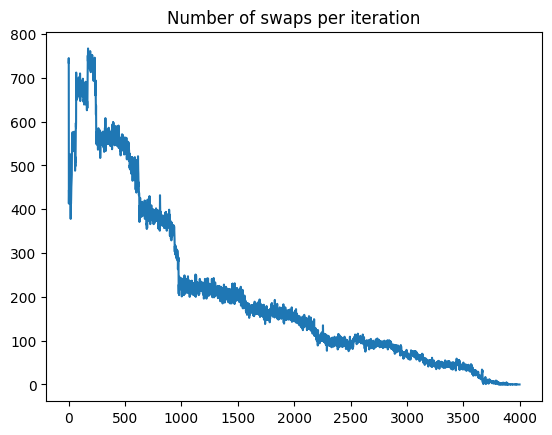

In [39]:
plt.plot(number_of_swaps)
plt.title('Number of swaps per iteration')


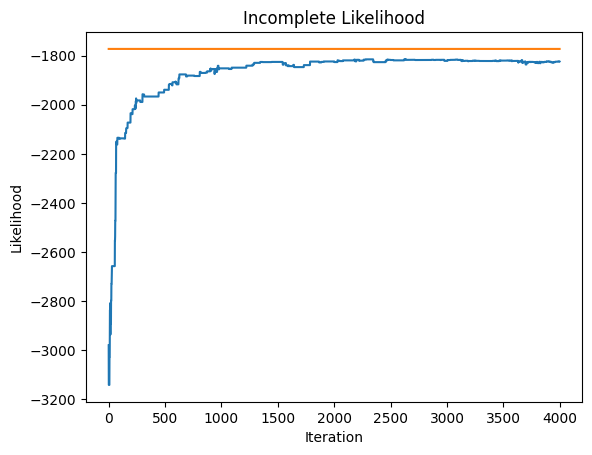

In [41]:
import matplotlib.pyplot as plt
plt.plot(incomplete_likelihoods)
plt.title("Incomplete Likelihood")
plt.ylabel("Likelihood")
plt.xlabel("Iteration")
plt.plot(range(0,4000),np.ones(4000)*-1773.1408478418512
)

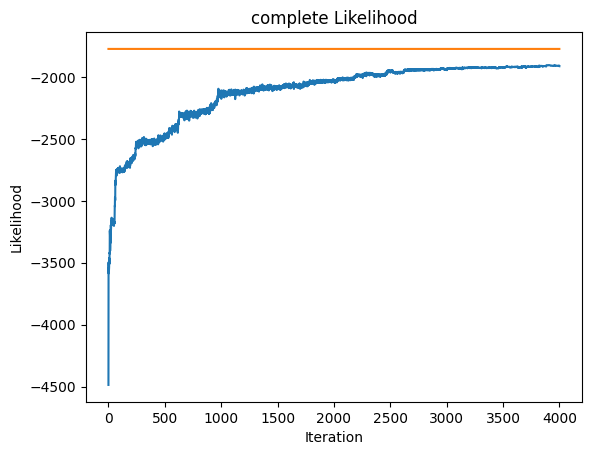

In [43]:
plt.plot(complete_likelihoods)
plt.title("complete Likelihood")
plt.ylabel("Likelihood")
plt.xlabel("Iteration")
plt.plot(range(0,4000),np.ones(4000)*-1773.1408478418512
)


In [ ]:
params_sampler.get_chain(discard=0, thin=1, flat=False)

In [140]:
involvement_II = {'II': True}
involvement_III = {'III': True}
component_list = list(range(len(mixture.components)))
component_dictionary_early_all_sampled = {}


In [62]:
params_sampler.get_chain(discard=0, thin=1, flat=True).shape

(360090, 18)

In [141]:
for component in component_list:
    risk_dictionary = {

        'II': [],
        'III': [],
        'IV': []
    }
    for sample in params_sampler.get_chain(discard=1000, thin=5, flat=True):
        mixture.set_params(*sample)
        risk_dictionary['II'].append(mixture.components[component].risk(involvement = involvement_II, t_stage = 'early'))
        risk_dictionary['III'].append(mixture.components[component].risk(involvement = involvement_III, t_stage = 'early'))
        risk_dictionary['IV'].append(mixture.components[component].risk(involvement = {'IV': True}, t_stage = 'early'))
    component_dictionary_early_all_sampled[str(component)] = risk_dictionary

In [85]:
from cycler import cycler
def multiple_plotter_component(risk_dictionary, component, stage = ''):
    COLORS = {
        "blue": '#005ea8',
        "orange": '#f17900',
        "red": '#ae0060',
    }
    hist_cycl = (
        cycler(histtype=["stepfilled", "step"])
        * cycler(color=list(COLORS.values()))
    )
    line_cycl = (
        cycler(linestyle=["-", "--"])
        * cycler(color=list(COLORS.values()))
    )
    min_value = 0
    max_value = 100
    prevalence = {}
    number_of_patients = {}
    risks = {}
    for key in risk_dictionary.keys():
        risks[key] = np.array(risk_dictionary[key])*100
    
    values = [risks[key] for key in risk_dictionary.keys()]
    hist_kwargs = {
                "bins": np.linspace(min_value, max_value, 80),"density": True,
                "alpha": 0.6,
                "linewidth": 2.,
            }
    fig, ax = plt.subplots(figsize=(12,4))

    x = np.linspace(min_value, max_value, 200)
    zipper = zip(values, risk_dictionary.keys(), hist_cycl)
    for vals, label, hstyle in zipper:
        ax.hist(
            vals,
            label=label,
            **hist_kwargs,
            **hstyle
        )
        ax.legend()
        ax.set_xlabel("probability [%]")
    plt.suptitle(f"Risk distributions {stage} for component {component}",fontsize = 16)
    

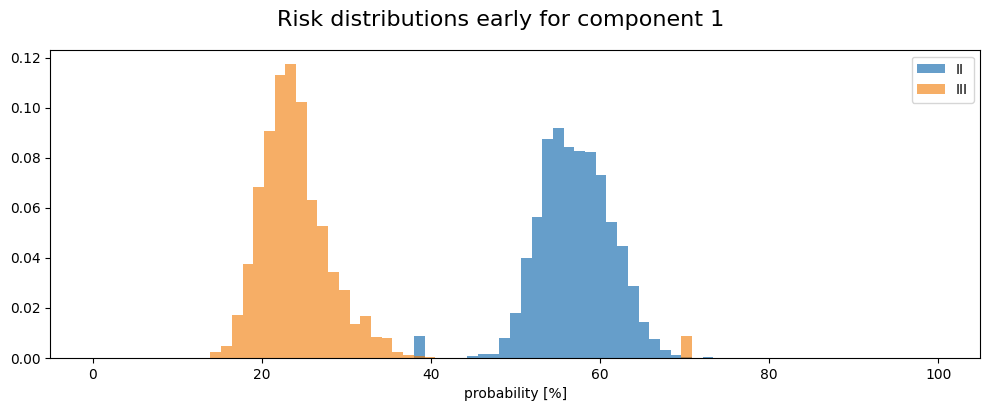

In [86]:
multiple_plotter_component(component_dictionary_early['1'], '1', 'early')

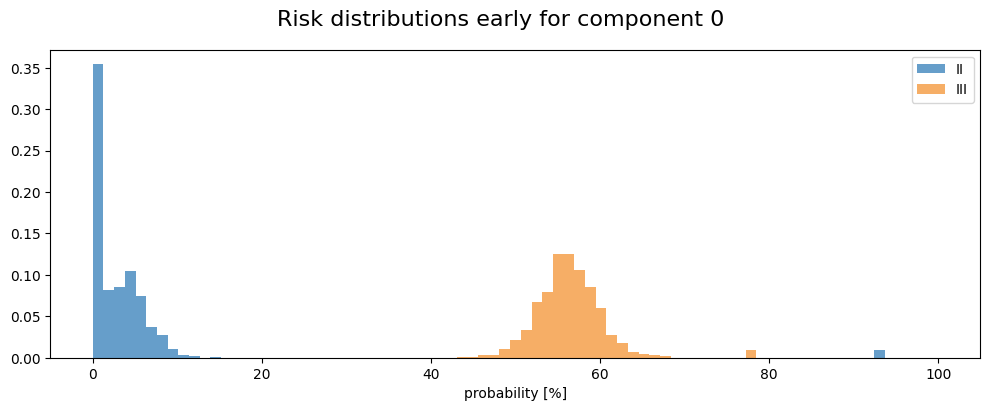

In [87]:
multiple_plotter_component(component_dictionary_early['0'], '0', 'early')

In [88]:
np.mean(risk_dictionary['III'])

0.24356372664901227

In [89]:
data_selected = data.loc[(data['tumor']['1']['subsite'] == 's3') & (data['tumor']['1']['t_stage'] == 'early')]  


In [90]:
from cycler import cycler
import scipy as sp
def multiple_plotter(dataset, risk_dictionary, subsite, stage = ''):
    COLORS = {"green": '#00afa5',
        "blue": '#005ea8',
        "orange": '#f17900',
        "red": '#ae0060',
        "gray": '#c5d5db',
    }
    hist_cycl = (
        cycler(histtype=["stepfilled", "step"])
        * cycler(color=list(COLORS.values()))
    )
    line_cycl = (
        cycler(linestyle=["-", "--"])
        * cycler(color=list(COLORS.values()))
    )
    if stage == 'early' or stage == 'late':
        data_selected = dataset.loc[(dataset['tumor']['1']['subsite'] == subsite) & (dataset['tumor']['1']['t_stage'] == stage)]  
    else:
        data_selected = dataset.loc[dataset['tumor']['1']['subsite'] == subsite]
    min_value = 0
    max_value = 100
    prevalence = {}
    number_of_patients = {}
    risks = {}
    for key in risk_dictionary.keys():
        prevalence[key] = (data_selected['path']['ipsi'][key] == True).sum()
        number_of_patients[key] = len(data_selected)
        risks[key] = np.array(risk_dictionary[key])*100
    
    num_matches = [prevalence[key] for key in risk_dictionary.keys()]
    num_totals = [number_of_patients[key] for key in risk_dictionary.keys()]
    values = [risks[key] for key in risk_dictionary.keys()]
    hist_kwargs = {
                "bins": np.linspace(min_value, max_value, 80),
                "density": True,
                "alpha": 0.6,
                "linewidth": 2.,
            }
    fig, ax = plt.subplots(figsize=(12,4))

    x = np.linspace(min_value, max_value, 200)
    zipper = zip(values, risk_dictionary.keys(), num_matches, num_totals, hist_cycl, line_cycl)
    for vals, label, a, n, hstyle, lstyle in zipper:
        ax.hist(
            vals,
            label=label,
            **hist_kwargs,
            **hstyle
        )
        if not np.isnan(a):
            post = sp.stats.beta.pdf(x / 100., a+1, n-a+1) / 100.
            ax.plot(x, post, label=f"{int(a)}/{int(n)}", **lstyle)
        ax.legend()
        ax.set_xlabel("probability [%]")
    plt.suptitle(f"Risk distributions {stage} for subsite {subsite}",fontsize = 16)
    

In [91]:
len(params_samples)

4001

In [93]:
subsite_dictionary_early = {}
subsite_list = list(mixture.subgroups.keys())

for sample in params_sampler.get_chain(discard=1000, thin=5, flat=True):
    mixture.set_params(*sample)
    if len(subsite_dictionary_early[subsite]['II'])%1000 == 0:
        print(len(subsite_dictionary_early[subsite]['II']),' done')
    for subsite in subsite_list:
        subsite_dictionary_early[subsite]['II'].append(mixture.risk(subgroup = subsite, involvement = involvement_II, t_stage = 'early'))
        subsite_dictionary_early[subsite]['III'].append(mixture.risk(subgroup = subsite, involvement = involvement_III, t_stage = 'early'))
        subsite_dictionary_early[subsite]['IV'].append(mixture.risk(subgroup = subsite, involvement = {'IV':True}, t_stage = 'early'))

1k done
1k done
1k done
1k done
1k done
1k done
1k done
1k done
1k done
1k done
1k done
1k done
1k done
1k done
1k done
1k done
1k done
1k done
1k done
1k done
1k done
1k done
1k done
1k done
1k done
1k done
1k done
1k done
1k done
1k done
1k done
1k done
1k done
1k done
1k done
1k done
1k done
1k done
1k done
1k done
1k done
1k done
1k done
1k done
1k done
1k done
1k done
1k done
1k done
1k done
1k done
1k done
1k done
1k done
1k done
1k done
1k done
1k done
1k done
1k done
1k done
1k done
1k done
1k done
1k done
1k done
1k done
1k done
1k done
1k done
1k done
1k done
1k done
1k done
1k done
1k done
1k done
1k done
1k done
1k done
1k done
1k done
1k done
1k done
1k done
1k done
1k done
1k done
1k done
1k done
1k done
1k done
1k done
1k done
1k done
1k done
1k done
1k done
1k done
1k done
1k done
1k done
1k done
1k done
1k done
1k done
1k done
1k done
1k done
1k done
1k done
1k done
1k done
1k done
1k done
1k done
1k done
1k done
1k done
1k done
1k done
1k done
1k done
1k done
1k done


KeyboardInterrupt: 

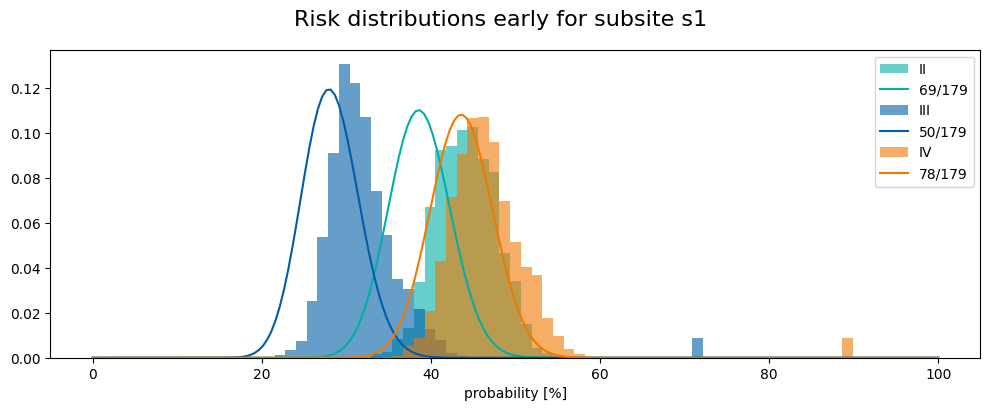

In [94]:
multiple_plotter(mixture.patient_data, risk_dictionary = subsite_dictionary_early['s1'], subsite = 's1', stage = 'early')

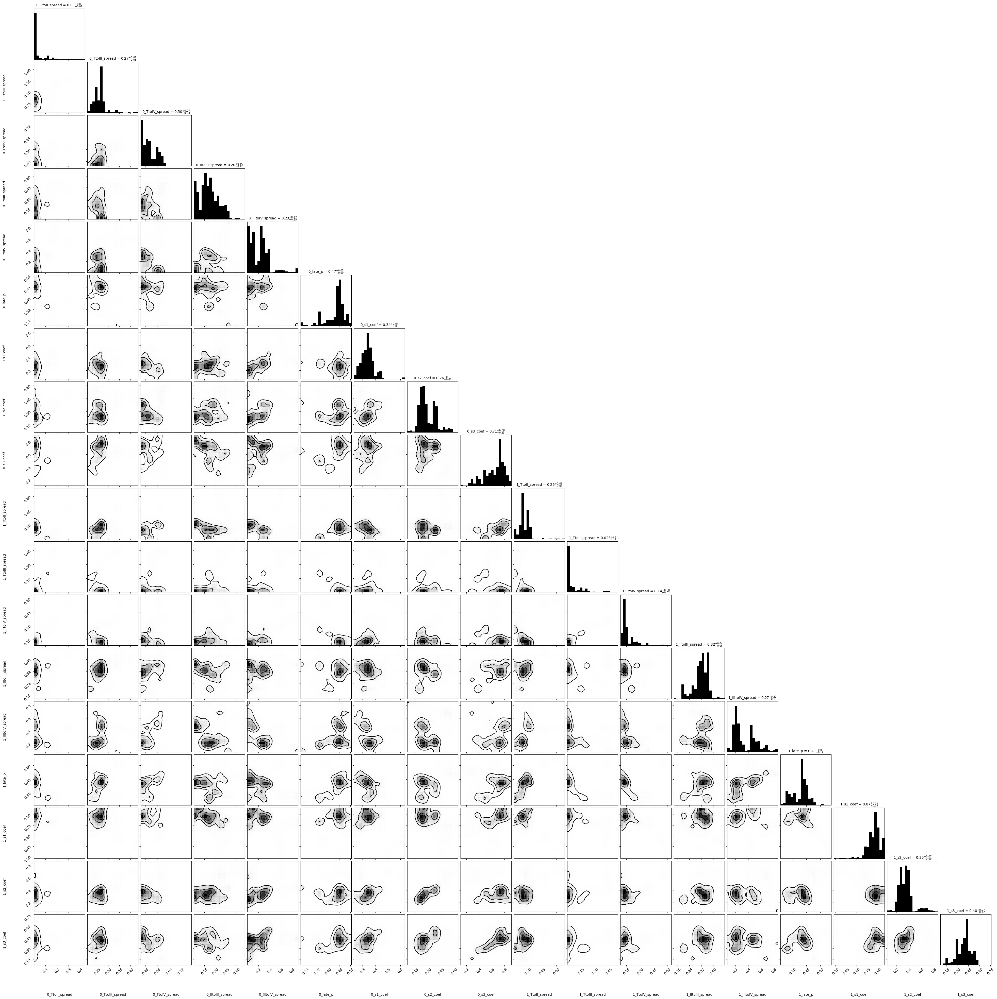

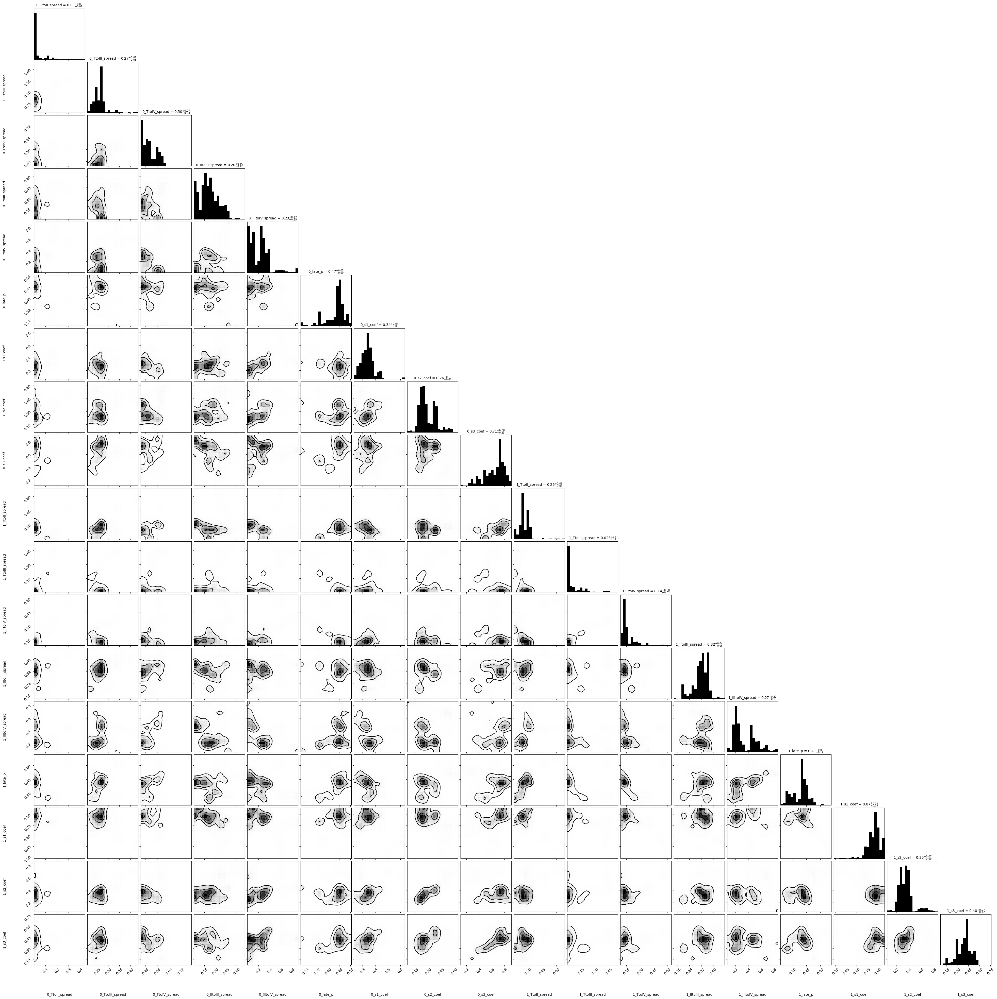

In [139]:
import corner
corner.corner(np.array(params_samples[1:]), labels = list(mixture.get_params().keys()), smooth = True, hist_kwargs = {'histtype':'stepfilled'},**{'plot_datapoints':False,'no_fill_contours':True, 'levels': np.array([0.2,0.5,0.8])},show_titles = True, title_kwargs={"fontsize": 10},labelpad = 0.25)

In [109]:
mixture.get_resps()

,0,1
0,1.0,0.0
1,1.0,0.0
2,1.0,0.0
3,1.0,0.0
4,1.0,0.0
...,...,...
995,0.0,1.0
996,0.0,1.0
997,0.0,1.0
998,0.0,1.0


## Fixed latent sampler

In [119]:
mixture.set_params(**em_params)
mixture.set_resps(em_latent)

In [120]:
from lymixture.em import sample_model_params

mixture.set_params(**em_params)
mixture.set_resps(em_latent)

samples_fixed_latent = sample_model_params(mixture, steps = 4000)
# indices = np.random.choice(len(samples), 50, replace=False)
# reduced_set = samples[indices]


100%|██████████| 4000/4000 [19:11<00:00,  3.47it/s] 


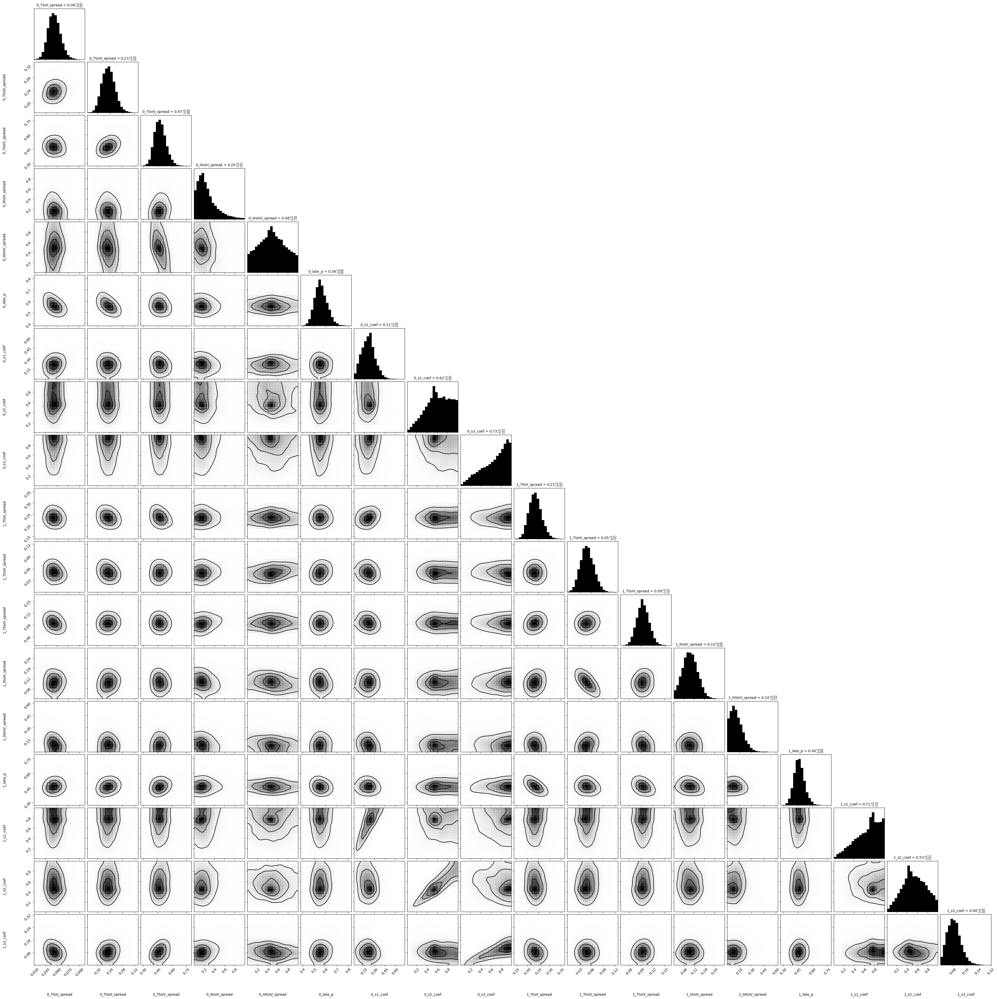

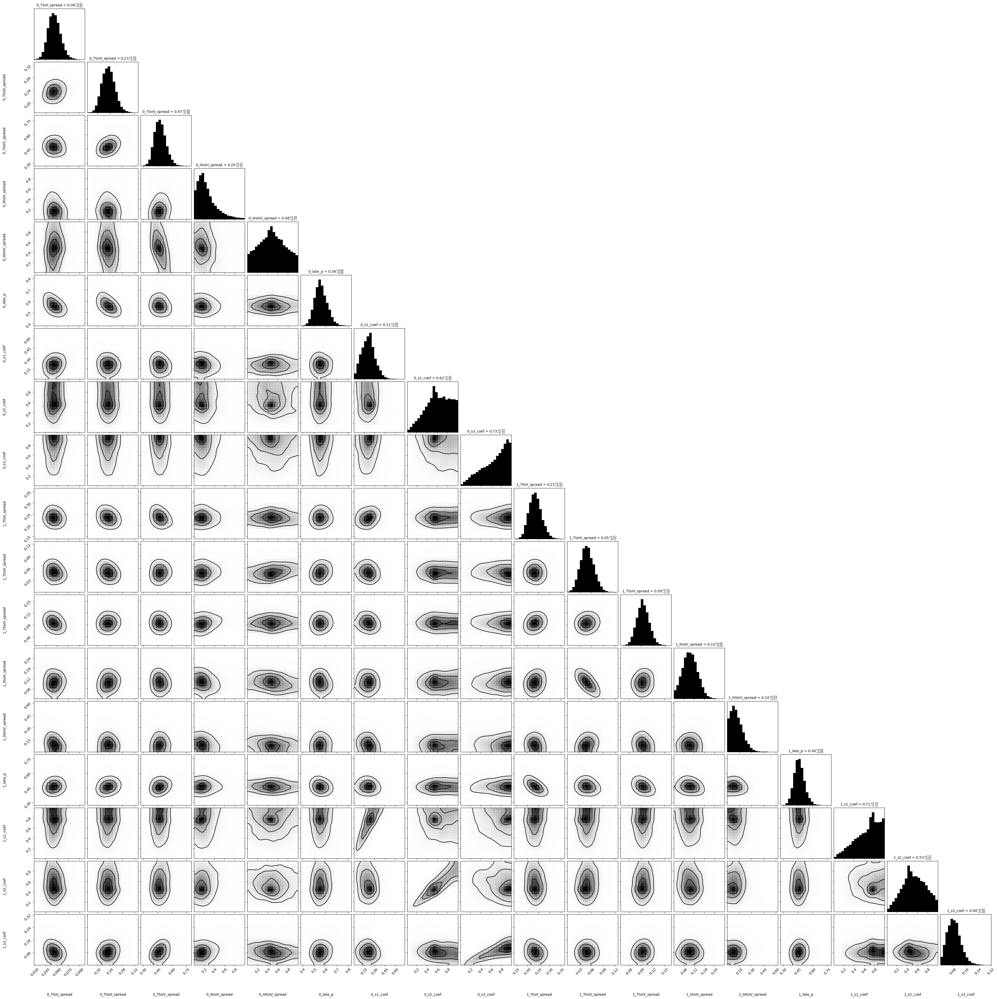

In [121]:
corner.corner(np.array(samples_fixed_latent), labels = list(mixture.get_params().keys()), smooth = True, hist_kwargs = {'histtype':'stepfilled'},**{'plot_datapoints':False,'no_fill_contours':True, 'levels': np.array([0.2,0.5,0.8])},show_titles = True, title_kwargs={"fontsize": 10},labelpad = 0.25)

In [124]:
component_dictionary_fixed_latent_early = {}
involvement_IV = {'IV': True}

for component in component_list:
    risk_dictionary = {

        'II': [],
        'III': [],
        'IV': []
    }
    for sample in samples_fixed_latent:
        mixture.set_params(*sample)
        risk_dictionary['II'].append(mixture.components[component].risk(involvement = involvement_II, t_stage = 'early'))
        risk_dictionary['III'].append(mixture.components[component].risk(involvement = involvement_III, t_stage = 'early'))
        risk_dictionary['IV'].append(mixture.components[component].risk(involvement = involvement_IV, t_stage = 'early'))
    component_dictionary_fixed_latent_early[str(component)] = risk_dictionary

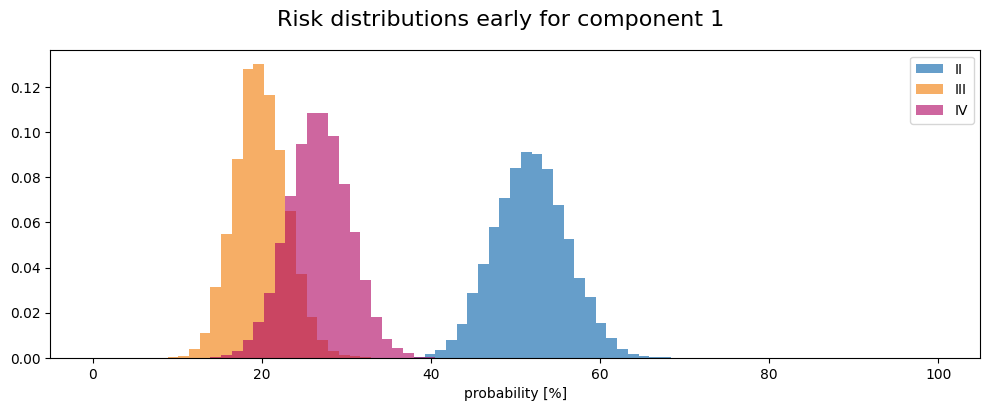

In [125]:
multiple_plotter_component(component_dictionary_fixed_latent_early['1'], '1', 'early')

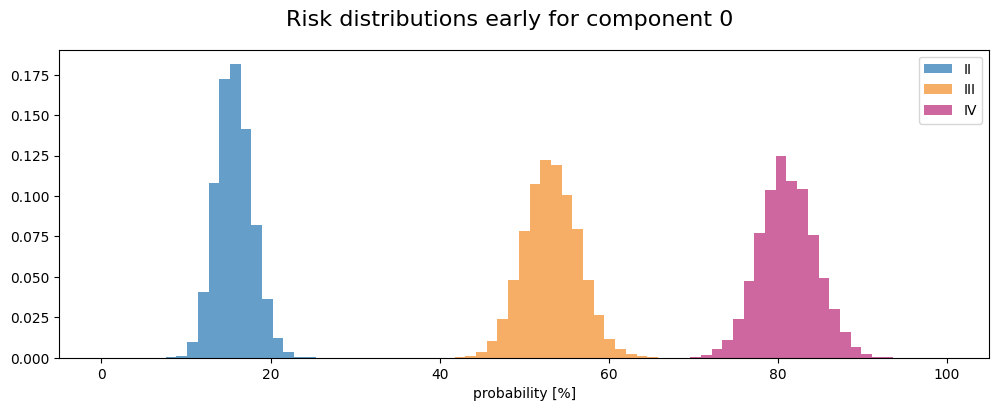

In [127]:
multiple_plotter_component(component_dictionary_fixed_latent_early['0'], '0', 'early')

In [134]:
subsite_dictionary_fixed_latent_early = {}
subsite_dictionary_fixed_latent_late = {}
subsite_list = list(mixture.subgroups.keys())
for subsite in subsite_list:
    subsite_dictionary_fixed_latent_early[subsite] = {
        'II': [],
        'III': [],
        'IV': []
    }
    subsite_dictionary_fixed_latent_late[subsite] = {
        'II': [],
        'III': [],
        'IV': []
    }

for sample in samples_fixed_latent:
    mixture.set_params(*sample)
    if len(subsite_dictionary_fixed_latent_early[subsite]['II'])%1000 == 0:
        print(len(subsite_dictionary_fixed_latent_early[subsite]['II']),' done')
    for subsite in subsite_list:
        subsite_dictionary_fixed_latent_early[subsite]['II'].append(mixture.risk(subgroup = subsite, involvement = involvement_II, t_stage = 'early'))
        subsite_dictionary_fixed_latent_early[subsite]['III'].append(mixture.risk(subgroup = subsite, involvement = involvement_III, t_stage = 'early'))
        subsite_dictionary_fixed_latent_early[subsite]['IV'].append(mixture.risk(subgroup = subsite, involvement = {'IV':True}, t_stage = 'early'))
        subsite_dictionary_fixed_latent_late[subsite]['II'].append(mixture.risk(subgroup = subsite, involvement = involvement_II, t_stage = 'late'))
        subsite_dictionary_fixed_latent_late[subsite]['III'].append(mixture.risk(subgroup = subsite, involvement = involvement_III, t_stage = 'late'))
        subsite_dictionary_fixed_latent_late[subsite]['IV'].append(mixture.risk(subgroup = subsite, involvement = {'IV':True}, t_stage = 'late'))

0  done
1000  done
2000  done
3000  done
4000  done
5000  done
6000  done
7000  done
8000  done
9000  done
10000  done
11000  done
12000  done
13000  done
14000  done
15000  done
16000  done
17000  done
18000  done
19000  done
20000  done
21000  done
22000  done
23000  done
24000  done
25000  done
26000  done
27000  done
28000  done
29000  done
30000  done
31000  done
32000  done
33000  done
34000  done
35000  done


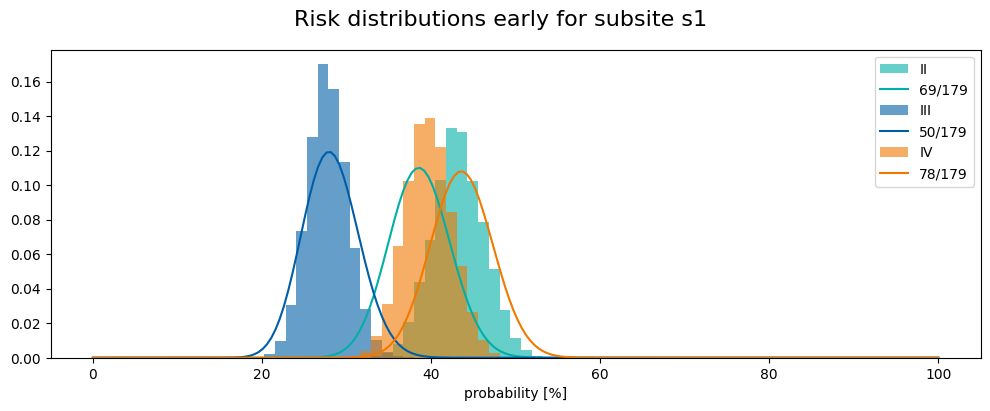

In [138]:
multiple_plotter(mixture.patient_data, risk_dictionary = subsite_dictionary_fixed_latent_early['s1'], subsite = 's1', stage = 'early')

## fixed mixture

In [101]:
## fixed mixture sampling
from lymixture.em import sample_fixed_mixture, _set_params, _get_params

mixture.set_params(**em_params)
mixture.set_resps(em_latent)


samples_fixed_mixture = sample_fixed_mixture(mixture, steps = 4000)


100%|██████████| 4000/4000 [18:01<00:00,  3.70it/s] 


In [103]:
mixture.get_params().keys()

dict_keys(['0_TtoII_spread', '0_TtoIII_spread', '0_TtoIV_spread', '0_IItoIII_spread', '0_IIItoIV_spread', '0_late_p', '0_s1_coef', '0_s2_coef', '0_s3_coef', '1_TtoII_spread', '1_TtoIII_spread', '1_TtoIV_spread', '1_IItoIII_spread', '1_IIItoIV_spread', '1_late_p', '1_s1_coef', '1_s2_coef', '1_s3_coef'])

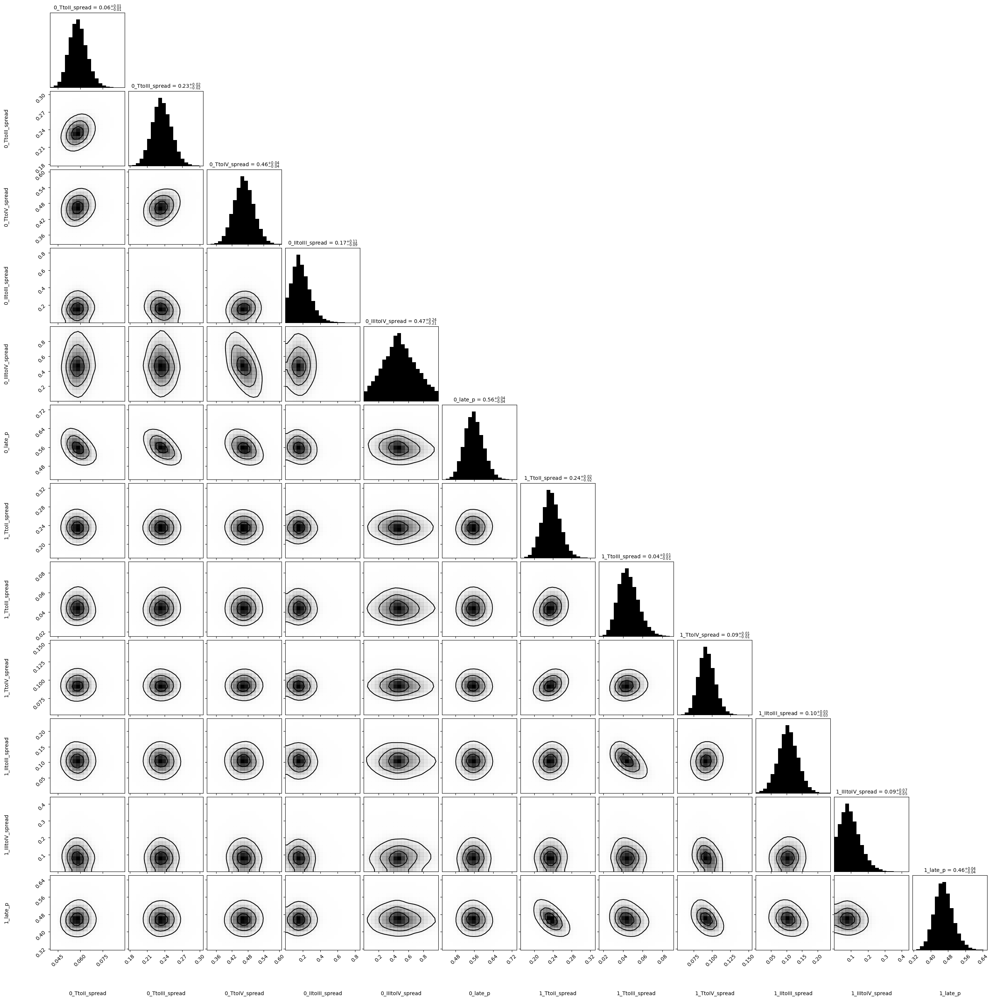

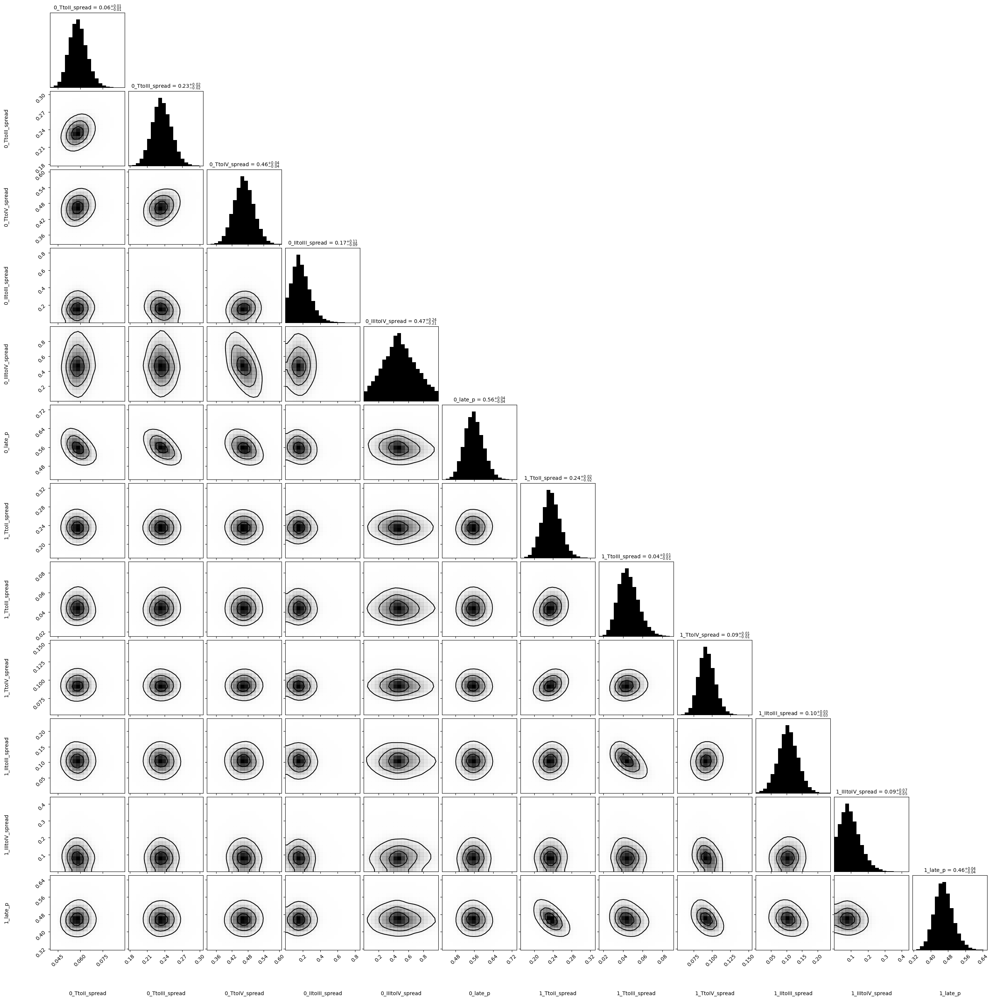

In [104]:
import corner
corner.corner(np.array(samples_fixed_mixture), labels = [list(mixture.get_params().keys())[i] for i in [0,1,2,3,4,5,9,10,11,12,13,14]], smooth = True, hist_kwargs = {'histtype':'stepfilled'},**{'plot_datapoints':False,'no_fill_contours':True, 'levels': np.array([0.2,0.5,0.8])},show_titles = True, title_kwargs={"fontsize": 10},labelpad = 0.25)

In [156]:
import matplotlib.pyplot as plt

In [105]:
involvement_II = {'II': True}
involvement_III = {'III': True}
involvement_IV = {'IV': True}
component_list = list(range(len(mixture.components)))
component_dictionary_early = {}

In [107]:
for component in component_list:
    risk_dictionary = {

        'II': [],
        'III': [],
        'IV': []
    }
    for sample in samples_fixed_mixture:
        _set_params(mixture, sample)
        risk_dictionary['II'].append(mixture.components[component].risk(involvement = involvement_II, t_stage = 'early'))
        risk_dictionary['III'].append(mixture.components[component].risk(involvement = involvement_III, t_stage = 'early'))
        risk_dictionary['IV'].append(mixture.components[component].risk(involvement = involvement_IV, t_stage = 'early'))
    component_dictionary_early[str(component)] = risk_dictionary

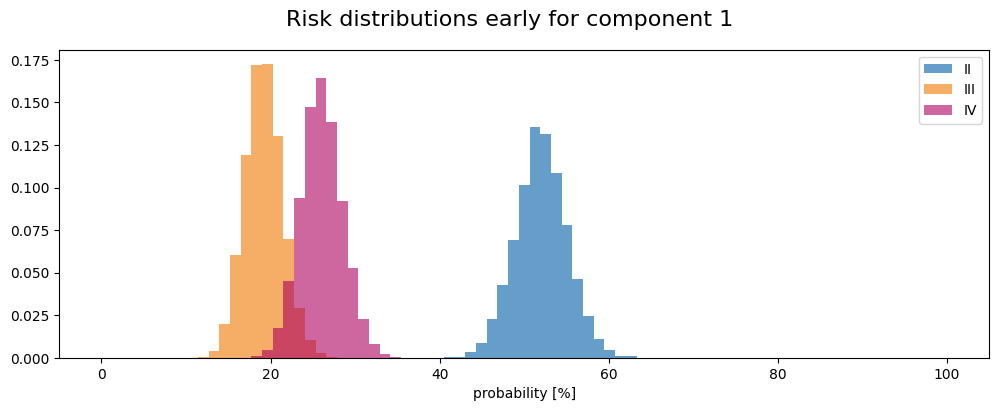

In [108]:
multiple_plotter_component(component_dictionary_early['1'], '1', 'early')

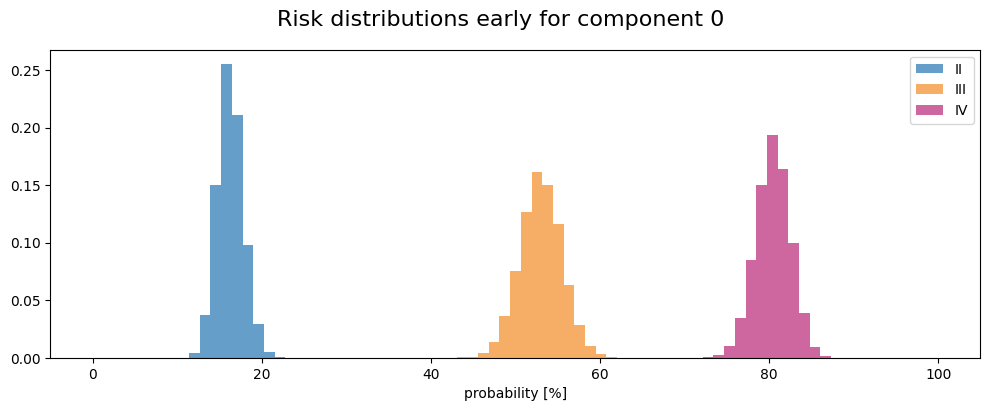

In [109]:
multiple_plotter_component(component_dictionary_early['0'], '0', 'early')

In [110]:
involvement_II
involvement_III

{'III': True}

In [112]:
subsite_dictionary_early = {}
subsite_dictionary_late = {}
subsite_list = list(mixture.subgroups.keys())
for subsite in subsite_list:
    subsite_dictionary_early[subsite] = {
        'II': [],
        'III': [],
        'IV': []
    }

for sample in samples_fixed_mixture:
    _set_params(mixture, sample)
    if len(subsite_dictionary_early[subsite]['II'])%1000 == 0:
        print(len(subsite_dictionary_early[subsite]['II']),' done')
    for subsite in subsite_list:
        subsite_dictionary_early[subsite]['II'].append(mixture.risk(subgroup = subsite, involvement = involvement_II, t_stage = 'early'))
        subsite_dictionary_early[subsite]['III'].append(mixture.risk(subgroup = subsite, involvement = involvement_III, t_stage = 'early'))
        subsite_dictionary_early[subsite]['IV'].append(mixture.risk(subgroup = subsite, involvement = {'IV':True}, t_stage = 'early'))
        subsite_dictionary_late[subsite]['II'].append(mixture.risk(subgroup = subsite, involvement = involvement_II, t_stage = 'late'))
        subsite_dictionary_late[subsite]['III'].append(mixture.risk(subgroup = subsite, involvement = involvement_III, t_stage = 'late'))
        subsite_dictionary_late[subsite]['IV'].append(mixture.risk(subgroup = subsite, involvement = {'IV':True}, t_stage = 'late'))

0  done
1000  done
2000  done
3000  done
4000  done
5000  done
6000  done
7000  done
8000  done
9000  done
10000  done
11000  done
12000  done
13000  done
14000  done
15000  done
16000  done
17000  done
18000  done
19000  done
20000  done
21000  done
22000  done
23000  done


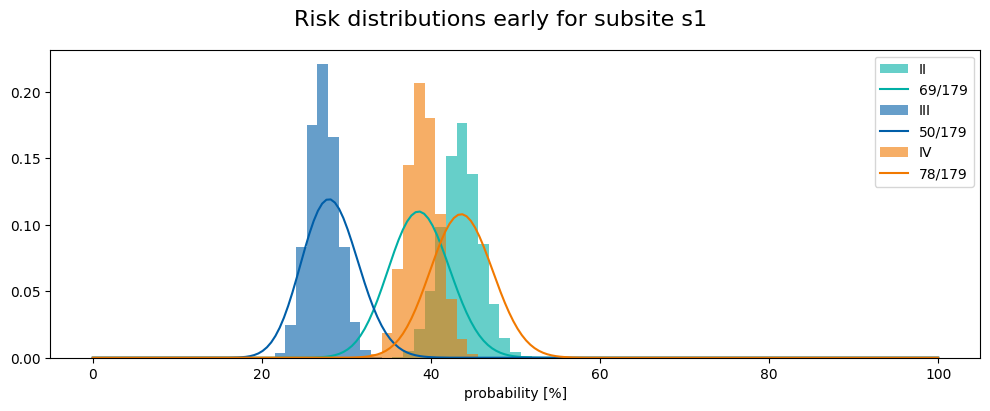

In [117]:
multiple_plotter(mixture.patient_data, risk_dictionary = subsite_dictionary_early['s1'], subsite = 's1', stage = 'early')

In [118]:
mixture.risk(subgroup = 's1', involvement = involvement_II, t_stage = 'early')

0.4446797589710104

In [165]:
mixture.risk('s3',involvement = {'II':True}, t_stage = 'early')

0.19939162489725154

In [162]:
mixture.risk('s3',involvement = {'II':True}, t_stage = 'early')

0.19939162489725154

In [163]:
mixture.get_params()

{'0_TtoII_spread': 0.2465950307143681,
 '0_TtoIII_spread': 0.0011024025497770355,
 '0_IItoIII_spread': 0.14453806113932985,
 '0_late_p': 0.501600476184744,
 '0_s1_coef': 0.6746865789372768,
 '0_s2_coef': 0.3714284201986132,
 '0_s3_coef': 0.007866362886752515,
 '1_TtoII_spread': 0.07222344820026987,
 '1_TtoIII_spread': 0.23513999610357655,
 '1_IItoIII_spread': 0.03553455412682656,
 '1_late_p': 0.47622414730263873,
 '1_s1_coef': 0.32531342106272315,
 '1_s2_coef': 0.6285715798013868,
 '1_s3_coef': 0.9921336371132475}